In [1]:
import sys
sys.path.append("..")

import json
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from PIL import Image
from einops import rearrange
from sklearn.neighbors import NearestNeighbors

from diffusion_model import MODELS_DIR, SAMPLES_DIR, get_mnist_dataset

In [2]:
metadata = None

def load_metadata():
    global metadata
    metadata = json.load(open(os.path.join(MODELS_DIR, "metadata.json")))

def plot(model_ids, arg=None, y_lambda=lambda x, *_: x):
    y_axis = [y_lambda(metadata[a]["loss"], metadata[a]["args"]) for a in model_ids]
    if arg:
        x_axis = [str(metadata[a]["args"][arg]) for a in model_ids]
    else:
        x_axis = model_ids
    plt.bar(x_axis, y_axis)
    plt.ylabel("Loss")
    plt.xlabel(arg)
    plt.show()

    fig, axes = plt.subplots(1, len(model_ids), figsize=(4*len(model_ids), 4), dpi=300)
    for ax, bs, m_id in zip(axes, x_axis, model_ids):
        img = mpimg.imread(os.path.join(SAMPLES_DIR, "grid", m_id + ".png"))
        ax.imshow(img)
        ax.set_title(f"{arg}={bs}")
        ax.axis("off")

# Best `batch_size`

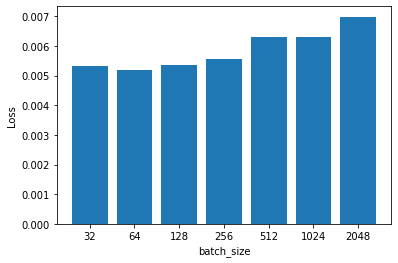

FileNotFoundError: [Errno 2] No such file or directory: '/home/lamsade/lmarandat/assignment2-22-nico_luc_hipp/samples/9965e625f6a0151908fa813ca096e493fc17223c.png'

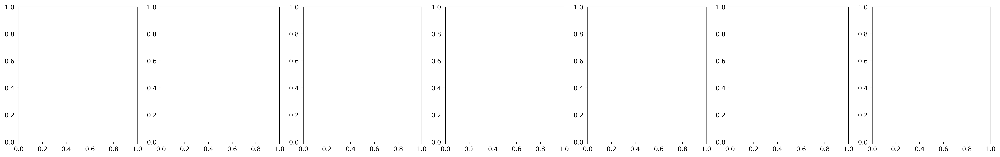

In [3]:
load_metadata()

selected_model_ids = [
    "9965e625f6a0151908fa813ca096e493fc17223c",
    "c4aa06b1b88fac155467d72136dbb1bd574b02df",
    "46593e02cbbb590d0a91b6278cc8d02b7dbc1d60",
    "45ee082b43d383745b2c3ade9a6fc66b6beabf68",
    "838c1428a245e3b194907cc53c2e262459abb886",
    "094b9bbcf3bfaccaf022cc07ba4693d14172f1a8",
    "e5bcd70eb1b405f75f251414a285a52be1c0b8c7",
]

plot(selected_model_ids, "batch_size")

We will choose a `batch_size` of $512$.

# Best `loss`

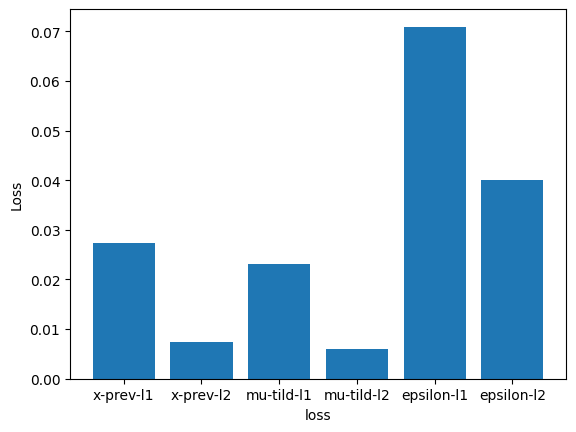

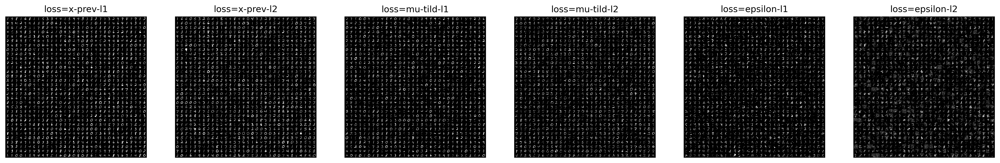

In [ ]:
load_metadata()

selected_model_ids = [
    "4a5ba14ed27425fb0047d1690de78b851dfe821a",
    "058c3c3806a6b75e6744bc39de97da0ca372abbd",
    "d4befc659bb9d849b17af3f336bc5096a17fc868",
    "a4cc1d60186c2515f9568a7674750c827d1563c2",
    "a3f2e8d0c21d8294462b26fbb7d97ffa16d93e64",
    "87bfd878156a202f2752b3e89b5173e67513806a",
]

plot(selected_model_ids, "loss")

# `1000` epochs

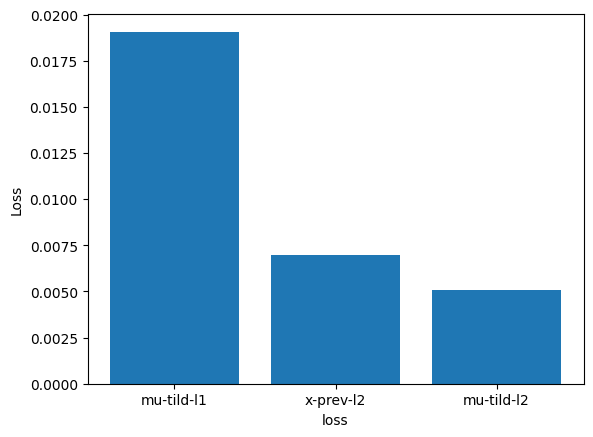

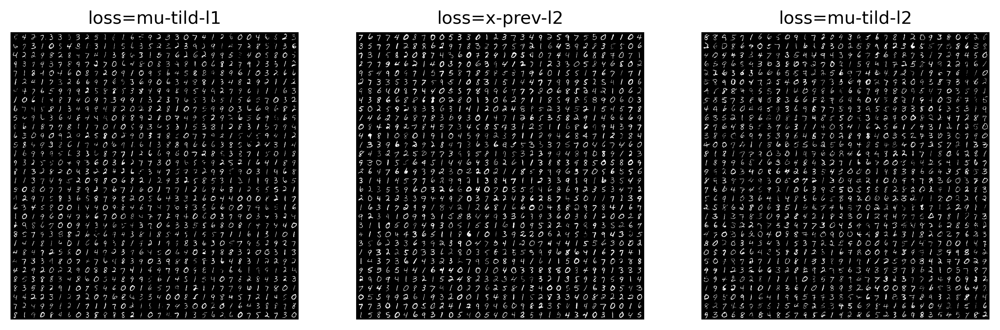

In [ ]:
load_metadata()

selected_model_ids = [
    "0990623cddd911a710bbc398e040718fe6dfb584",
    "09593b8aa5cc97196cbe3d9f33ca8da9a60d2423",
    "17d2a1ea86a08e4bb547f304550db43b73709075",
]

plot(selected_model_ids, "loss")

# Best `channels`

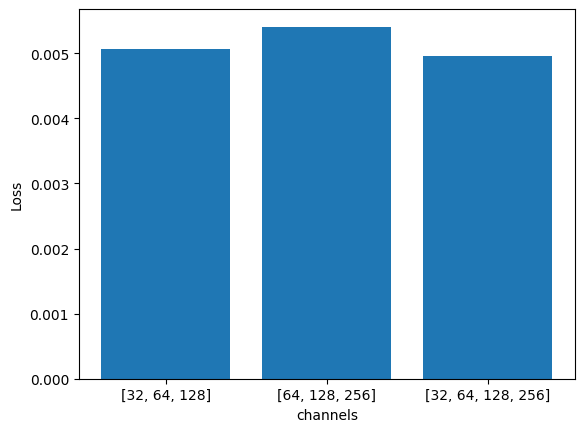

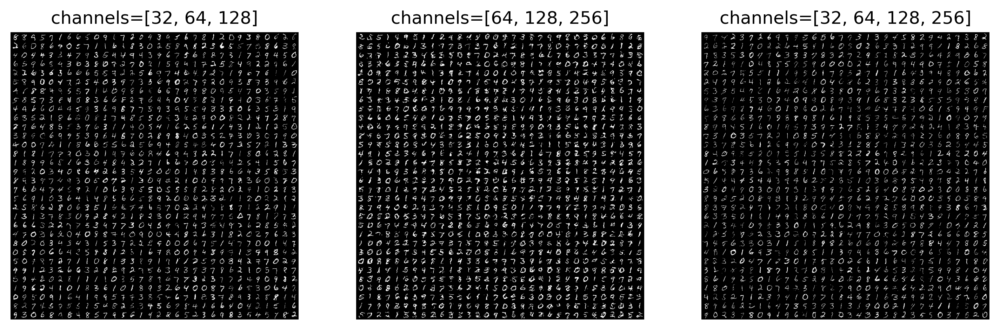

In [ ]:
load_metadata()

selected_model_ids = [
    "17d2a1ea86a08e4bb547f304550db43b73709075",
    "b48ea8d368fdb63bc890dd87361c47416c66428e",
    "f6e20eee8a2702b174acd04bf0b7fd62b59eb135",
]

plot(selected_model_ids, "channels")

# Best `nb_steps`

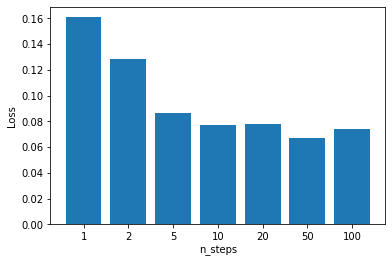

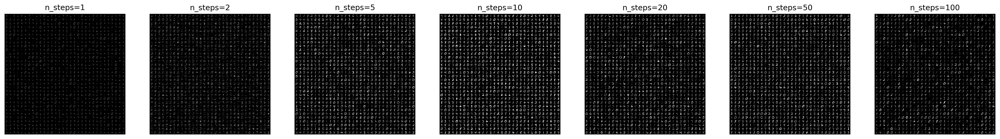

In [ ]:
load_metadata()

selected_model_ids = [
    "ae644d494385db5f1ffa8c0707cd55ad3b145951",
    "4648753978db179661bbbe5b53722a1ad66f38ba",
    "c7a9b2f797ac37317666749e68e0950a5bc6f491",
    "59ec778dd3b9a94d2406e14ee94c07b68b10365e",
    "2d607f706655d1d33ae01716c791c51187977592",
    "88e65db88b28ba1f547f34d0187f22b69f9d9592",
    "cfbfe84ac9872f0b57da128ce3700d96d52debe0",
]

plot(selected_model_ids, "n_steps", lambda loss, args: loss * args["n_steps"])
# plot(selected_model_ids, "n_steps")

# Best `epochs`

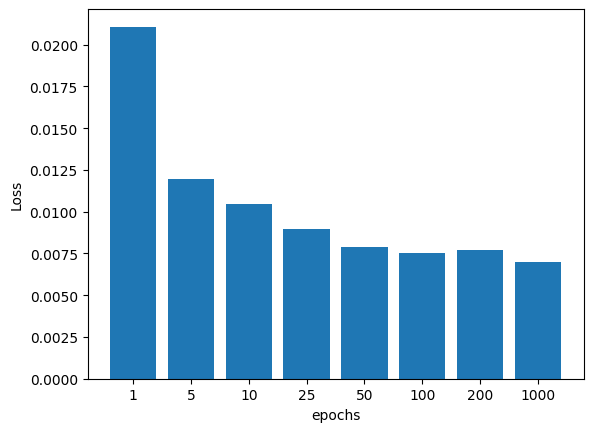

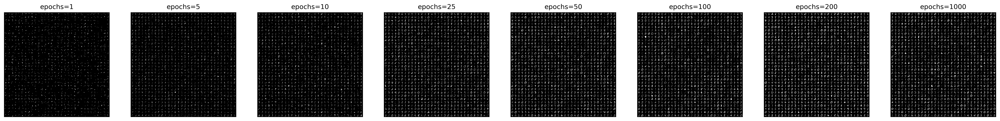

In [ ]:
load_metadata()

selected_model_ids = [
    "bdfb5c01f698bf9871be0941f0acf21fc291e4bf", # 1 epochs
    "72bcdd268879f32df5ec439c1af9c07c33555e2a", # 5 epochs
    "96eb02fa623e08088904b22bc203c4f0cd584587", # 10 epochs
    "1ad2220f73c4d6c9ddcca3f20cdfe4650ca8a917", # 25 epochs
    "b4c4faff532fa68c3728f6e368089861450d316d", # 50 epochs
    "058c3c3806a6b75e6744bc39de97da0ca372abbd", # 100 epochs
    "59ec778dd3b9a94d2406e14ee94c07b68b10365e", # 200 epochs
    "09593b8aa5cc97196cbe3d9f33ca8da9a60d2423", # 1000 epochs
]

plot(selected_model_ids, "epochs")

# Test generated image

min=0, max=255


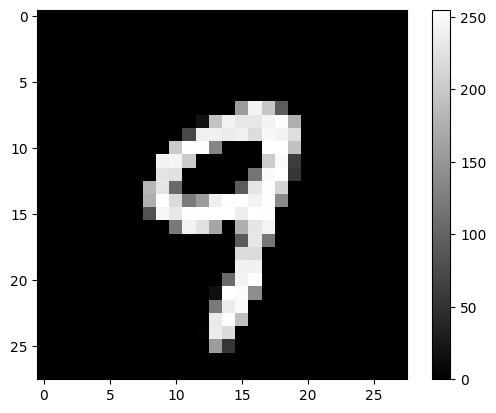

In [ ]:
img = PIL.Image.open(os.path.join(SAMPLES_DIR, "0.png"))
img = np.array(img)
plt.imshow(img, cmap="gray")
plt.colorbar();

print(f"min={img.min()}, max={img.max()}")

# Find nearest image of generated from dataset

In [ ]:
train_loader, _ = get_mnist_dataset(batch_size=1, normalize_range=(0, 255))
X = [b[0] for b in train_loader]
X = rearrange(X, "n 1 1 h w -> n h w")
X = X[:, 2:30, 2:30]
X = rearrange(X, "n h w -> n (h w)")
X = X.numpy()

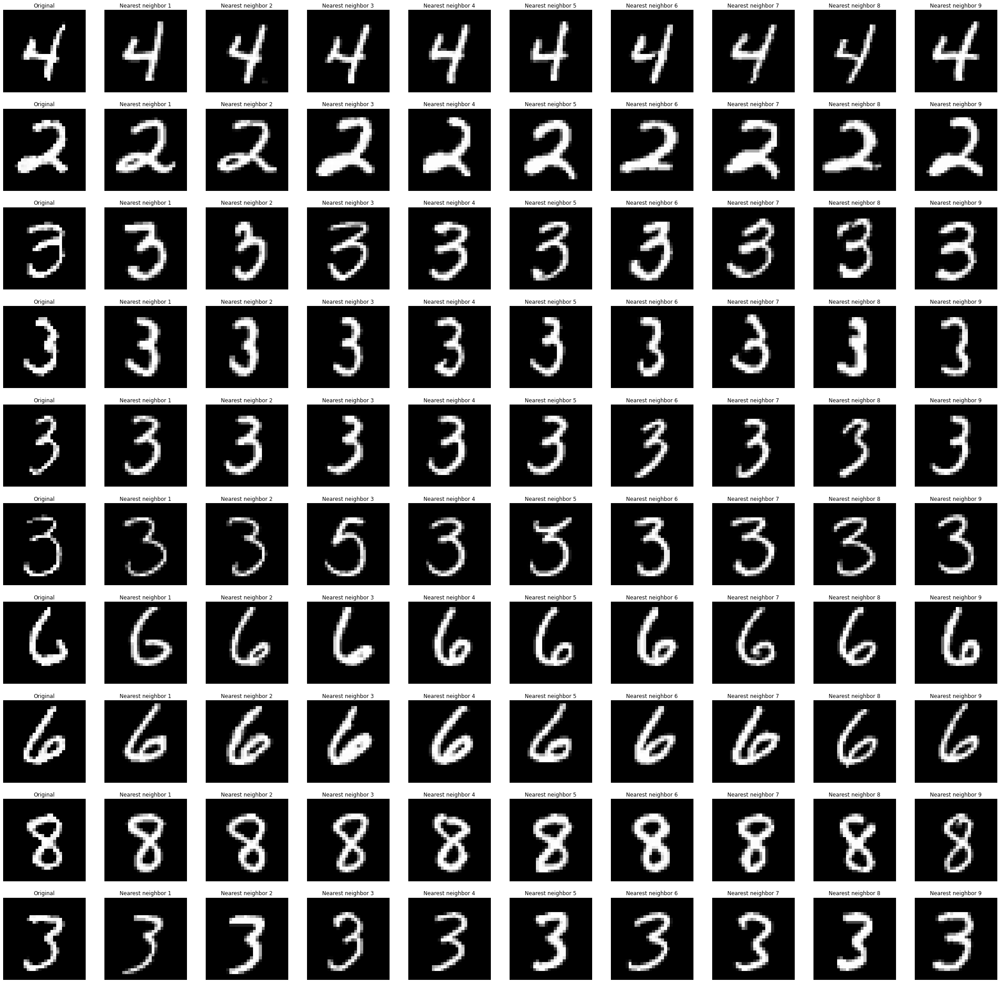

In [ ]:
N_IMG = 10
N_NBRS = 9

nbrs = NearestNeighbors(n_neighbors=N_NBRS, algorithm="brute", metric="l2").fit(X)
idx = np.random.randint(0, 1024, size=(N_IMG,))
img_paths = [os.path.join(SAMPLES_DIR, f"{i}.png") for i in idx]
imgs = [np.array(Image.open(fp).convert('L')) for fp in img_paths]

imgs_nbrs_idx = [nbrs.kneighbors(img.reshape(1, -1), return_distance=False)[0] for img in imgs]

_, axes = plt.subplots(N_IMG, N_NBRS + 1, figsize=(4*(N_NBRS + 1), 4*N_IMG))
for i, img in enumerate(imgs):
    axes[i, 0].imshow(img, cmap="gray")
    axes[i, 0].axis("off")
    axes[i, 0].set_title(f"Original")
    for j, nbr_idx in enumerate(imgs_nbrs_idx[i]):
        axes[i, j + 1].imshow(X[nbr_idx].reshape(28, 28), cmap="gray")
        axes[i, j + 1].axis("off")
        axes[i, j + 1].set_title(f"Nearest neighbor {j + 1}")